<a href="https://colab.research.google.com/github/gkdivya/EVA/blob/main/8_AdvancedTrainingConcepts/experiments/Cifar10_with_resnet18_LN_LR/Cifar10_with_resnet18_LN_LR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install git+https://github.com/albumentations-team/albumentations.git
!pip install torchsummary

  Cloning https://github.com/albumentations-team/albumentations.git to /tmp/pip-req-build-f63_hi2l
  Running command git clone -q https://github.com/albumentations-team/albumentations.git /tmp/pip-req-build-f63_hi2l
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98174 sha256=9aea94b6de68574cbc35d6f5616dfe6d09e3e1e5673f80fa3248b25fed4ea774
  Stored in directory: /tmp/pip-ephem-wheel-cache-op5o48qm/wheels/e2/85/3e/2a40fac5cc1f43ced656603bb2fca1327b30ec7de1b1b66517
Successfully built albumentations


In [ ]:
!git clone https://github.com/gkdivya/torch_cv_wrapper.git

fatal: destination path 'torch_cv_wrapper' already exists and is not an empty directory.


In [ ]:
from __future__ import print_function
import torchvision
import torch
from pprint import pprint
# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Libraries
from torch_cv_wrapper.utils import plot_metrics,train,test,helper
from torch_cv_wrapper.utils.gradcam import generate_gradcam, plot_gradcam
from torch_cv_wrapper.model import resnet
from torch_cv_wrapper.main import TriggerEngine

## Load config file

In [ ]:
config = helper.process_config("/content/drive/MyDrive/Cifar10_Resnet/session8_assignment/config_session8_lateassignment.yaml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'type': 'CIFAR10Albumentation'},
 'data_loader': {'args': {'batch_size': 256,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                             'ship',
                             'truck'],
                 'type': 'Cifar10DataLoader'},
 'lr_scheduler': 'ReduceLROnPlateau',
 'model': 'Resnet18',
 'model_params': {'dropout': 0.05,
                  'experiment_name': 'cifar10_with_resnet18_LN',
                  'model_dir': './model/',
                  'seed': 1},
 'optimizer': {'args': {'lr': 0.001}, 'type': 'optim.Adam'},
 'training_params

## Create Training Instance

In [ ]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerEngine(config)

## Download data and view sample images

In [ ]:
classes= config['data_loader']['classes']

#Get dataloaders
train_loader,test_loader = trigger_training.dataloader()


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


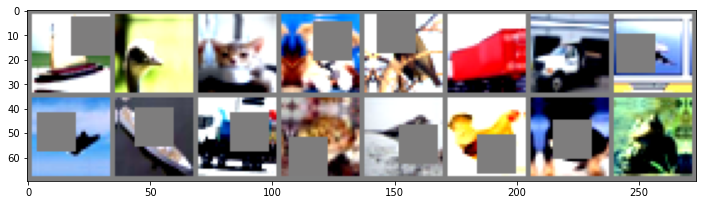

In [ ]:
# get some random training images
images, labels = iter(train_loader).next()

# # show images
helper.imshow(torchvision.utils.make_grid(images[:16]))

## Model Summary

In [ ]:
model = resnet.ResNet18("LN")
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
         GroupNorm-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
         GroupNorm-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
         GroupNorm-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
         GroupNorm-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
        GroupNorm-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 32, 32]          73,728
        GroupNorm-14          [-1, 128,

## Trigger training

In [ ]:
# trigger_training.
(exp_metrics[experiment_name]) = trigger_training.run_experiment(model,train_loader,test_loader)
#trigger_training.save_experiment(model,experiment_name,"/content/drive/MyDrive/Cifar10_Resnet/saved_models")

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch 1:


Loss=1.8958317041397095 Batch_id=195 LR=0.00100 Accuracy=20.26: 100%|██████████| 196/196 [00:58<00:00,  3.35it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0077, Accuracy: 2779/10000 (27.79%)

Epoch 2:


Loss=1.7341811656951904 Batch_id=195 LR=0.00100 Accuracy=31.44: 100%|██████████| 196/196 [00:58<00:00,  3.35it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0066, Accuracy: 3977/10000 (39.77%)

Epoch 3:


Loss=1.5829461812973022 Batch_id=195 LR=0.00100 Accuracy=38.97: 100%|██████████| 196/196 [00:58<00:00,  3.35it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0060, Accuracy: 4445/10000 (44.45%)

Epoch 4:


Loss=1.419417142868042 Batch_id=195 LR=0.00100 Accuracy=42.76: 100%|██████████| 196/196 [00:58<00:00,  3.36it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0056, Accuracy: 4971/10000 (49.71%)

Epoch 5:


Loss=1.5358864068984985 Batch_id=195 LR=0.00100 Accuracy=47.01: 100%|██████████| 196/196 [00:58<00:00,  3.35it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0056, Accuracy: 4981/10000 (49.81%)

Epoch 6:


Loss=1.4621860980987549 Batch_id=195 LR=0.00100 Accuracy=50.62: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0049, Accuracy: 5483/10000 (54.83%)

Epoch 7:


Loss=1.156994104385376 Batch_id=195 LR=0.00100 Accuracy=54.02: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0043, Accuracy: 5959/10000 (59.59%)

Epoch 8:


Loss=0.917637825012207 Batch_id=195 LR=0.00100 Accuracy=56.78: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0050, Accuracy: 5435/10000 (54.35%)

Epoch 9:


Loss=1.1820430755615234 Batch_id=195 LR=0.00100 Accuracy=58.46: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 6552/10000 (65.52%)

Epoch 10:


Loss=1.093083143234253 Batch_id=195 LR=0.00100 Accuracy=61.01: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0040, Accuracy: 6408/10000 (64.08%)

Epoch 11:


Loss=1.14859938621521 Batch_id=195 LR=0.00100 Accuracy=63.37: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0036, Accuracy: 6854/10000 (68.54%)

Epoch 12:


Loss=0.9431864023208618 Batch_id=195 LR=0.00100 Accuracy=65.24: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 6900/10000 (69.00%)

Epoch 13:


Loss=0.9380429983139038 Batch_id=195 LR=0.00100 Accuracy=67.04: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0036, Accuracy: 6861/10000 (68.61%)

Epoch 14:


Loss=0.7487483024597168 Batch_id=195 LR=0.00100 Accuracy=69.01: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 7207/10000 (72.07%)

Epoch 15:


Loss=0.8383620977401733 Batch_id=195 LR=0.00100 Accuracy=70.26: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 7507/10000 (75.07%)

Epoch 16:


Loss=0.917985737323761 Batch_id=195 LR=0.00100 Accuracy=72.14: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 7622/10000 (76.22%)

Epoch 17:


Loss=0.7565293312072754 Batch_id=195 LR=0.00100 Accuracy=73.48: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 7931/10000 (79.31%)

Epoch 18:


Loss=0.6109765768051147 Batch_id=195 LR=0.00100 Accuracy=74.51: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 7780/10000 (77.80%)

Epoch 19:


Loss=0.7406558394432068 Batch_id=195 LR=0.00100 Accuracy=75.73: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 7989/10000 (79.89%)

Epoch 20:


Loss=0.651975154876709 Batch_id=195 LR=0.00100 Accuracy=77.06: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8093/10000 (80.93%)

Epoch 21:


Loss=0.8543360829353333 Batch_id=195 LR=0.00100 Accuracy=78.22: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8131/10000 (81.31%)

Epoch 22:


Loss=0.5843213200569153 Batch_id=195 LR=0.00100 Accuracy=78.30: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 8041/10000 (80.41%)

Epoch 23:


Loss=0.7562752962112427 Batch_id=195 LR=0.00100 Accuracy=79.49: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8379/10000 (83.79%)

Epoch 24:


Loss=0.40172165632247925 Batch_id=195 LR=0.00100 Accuracy=80.36: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8360/10000 (83.60%)

Epoch 25:


Loss=0.5321276783943176 Batch_id=195 LR=0.00100 Accuracy=80.74: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8434/10000 (84.34%)

Epoch 26:


Loss=0.5310409665107727 Batch_id=195 LR=0.00100 Accuracy=81.55: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0018, Accuracy: 8430/10000 (84.30%)

Epoch 27:


Loss=0.5504230260848999 Batch_id=195 LR=0.00100 Accuracy=82.20: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0018, Accuracy: 8466/10000 (84.66%)

Epoch 28:


Loss=0.4548879563808441 Batch_id=195 LR=0.00100 Accuracy=82.94: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8371/10000 (83.71%)

Epoch 29:


Loss=0.38220348954200745 Batch_id=195 LR=0.00100 Accuracy=83.10: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0017, Accuracy: 8550/10000 (85.50%)

Epoch 30:


Loss=0.5645345449447632 Batch_id=195 LR=0.00100 Accuracy=83.33: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8732/10000 (87.32%)

Epoch 31:


Loss=0.4112061560153961 Batch_id=195 LR=0.00100 Accuracy=84.24: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8664/10000 (86.64%)

Epoch 32:


Loss=0.5791297554969788 Batch_id=195 LR=0.00100 Accuracy=84.57: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8705/10000 (87.05%)

Epoch 33:


Loss=0.3664173185825348 Batch_id=195 LR=0.00100 Accuracy=85.09: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0017, Accuracy: 8615/10000 (86.15%)

Epoch 34:


Loss=0.1975061595439911 Batch_id=195 LR=0.00100 Accuracy=85.18: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8790/10000 (87.90%)

Epoch 35:


Loss=0.3392057418823242 Batch_id=195 LR=0.00100 Accuracy=85.38: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8690/10000 (86.90%)

Epoch 36:


Loss=0.4261108338832855 Batch_id=195 LR=0.00100 Accuracy=85.83: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8689/10000 (86.89%)

Epoch 37:


Loss=0.30360835790634155 Batch_id=195 LR=0.00100 Accuracy=86.37: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8782/10000 (87.82%)

Epoch 38:


Loss=0.5165297389030457 Batch_id=195 LR=0.00100 Accuracy=86.28: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8728/10000 (87.28%)

Epoch    38: reducing learning rate of group 0 to 2.0000e-04.
Epoch 39:


Loss=0.12279750406742096 Batch_id=195 LR=0.00020 Accuracy=89.82: 100%|██████████| 196/196 [00:58<00:00,  3.34it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0013, Accuracy: 9009/10000 (90.09%)

Epoch 40:


Loss=0.1579943150281906 Batch_id=195 LR=0.00020 Accuracy=91.21: 100%|██████████| 196/196 [00:58<00:00,  3.33it/s]



Test set: Average loss: 0.0013, Accuracy: 8975/10000 (89.75%)

Saving the model for cifar10_with_resnet18_LN


## Missclassification

Total wrong predictions are 1025
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


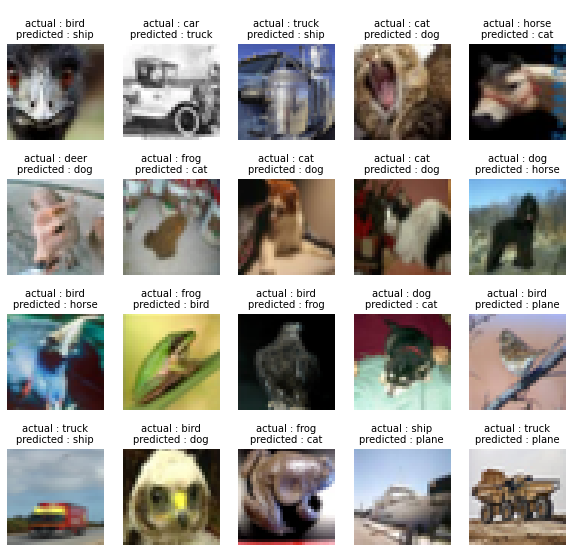

In [ ]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader)

## Plots for Validation Loss and Accuracy

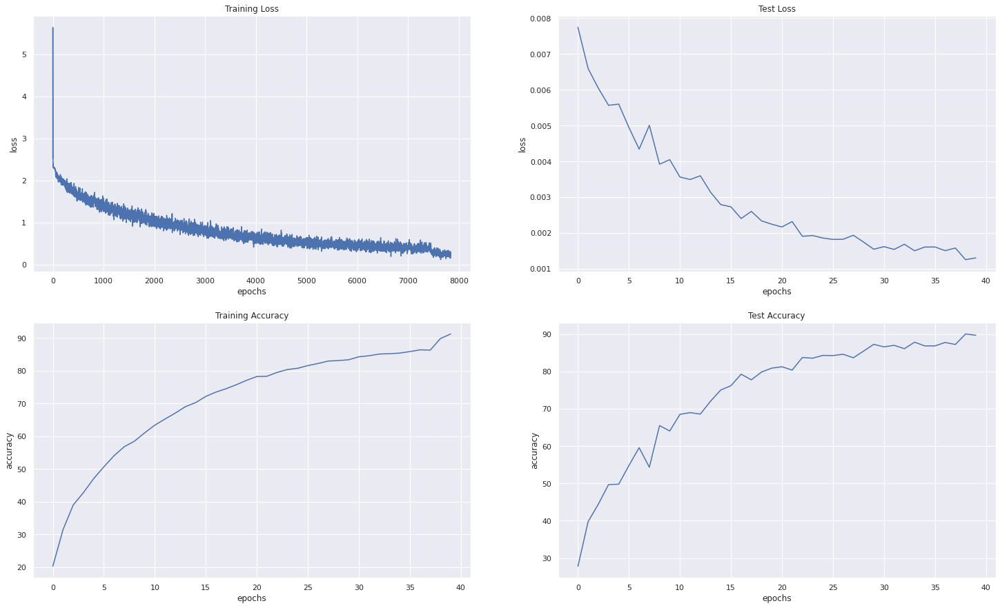

In [ ]:
plot_metrics.plot_metrics(exp_metrics[experiment_name])

## Accuracy for each class

In [ ]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 90 %
Accuracy of   car : 93 %
Accuracy of  bird : 82 %
Accuracy of   cat : 77 %
Accuracy of  deer : 91 %
Accuracy of   dog : 87 %
Accuracy of  frog : 93 %
Accuracy of horse : 91 %
Accuracy of  ship : 95 %
Accuracy of truck : 93 %


## Plot Confusion Matrix

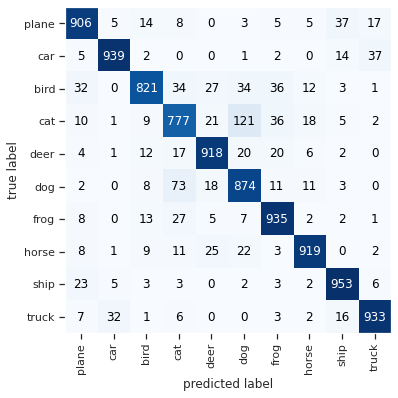

In [ ]:
mat = helper.compute_confusion_matrix(model,test_loader,device)
plot_metrics.plot_confusion_matrix(mat, class_names=classes)


## Generate & Plot GradCam Images

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


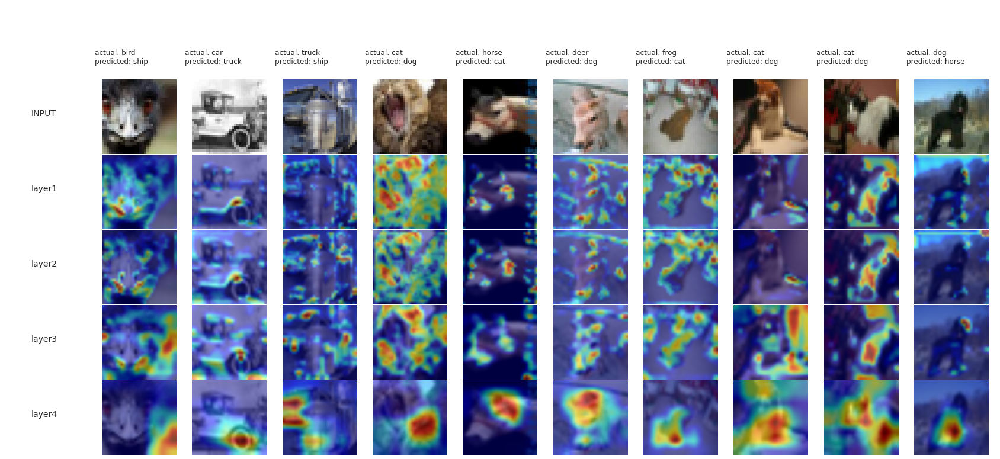

In [ ]:
target_layers = ["layer1","layer2","layer3","layer4"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


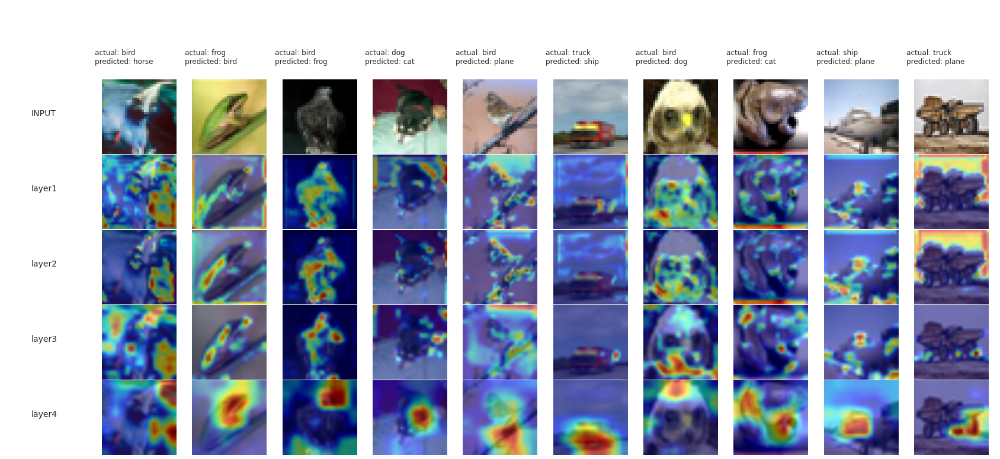

In [ ]:
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[10:20], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[10:20])

In [ ]:

%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>